## Intro
This project focuses on leveraging generative adversarial networks (GANs) to create images in the unique style of Monet. GANs are a type of generative deep learning model that consists of two neural networks: a generator and a discriminator. The generator network creates images, while the discriminator network evaluates them, distinguishing between real and generated images. The two networks are trained together, with the generator aiming to produce convincing Monet-style images and the discriminator trying to accurately classify them. The goal of this project is to generate 7,000 to 10,000 Monet-style images by training a GAN to mimic Monet's distinctive artistic style.


In [1]:
import numpy as np
import pandas as pd
import torch
from torch import nn
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import os

## Setup Helpers

In [2]:
class ArtDataset(Dataset):
    def __init__(self, art_dir, photo_dir, use_transformations=True):
        super().__init__()
        self.art_dir = art_dir
        self.photo_dir = photo_dir
        self.art_index = {}
        self.photo_index = {}
        
        self.transform = self._get_transformations(use_transformations)
        self._build_index()

    def _get_transformations(self, use_transformations):
        if use_transformations:
            return transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5], std=[0.5])
            ])
        else:
            return transforms.Compose([
                transforms.ToTensor()
            ])
        
    def _build_index(self):
        for idx, art in enumerate(os.listdir(self.art_dir)):
            self.art_index[idx] = art
        for idx, photo in enumerate(os.listdir(self.photo_dir)):
            self.photo_index[idx] = photo
        
    def __len__(self):
        return len(self.photo_index)
        
    def __getitem__(self, index):
        random_index = np.random.randint(0, len(self.art_index))
        photo_path = os.path.join(self.photo_dir, self.photo_index[index])
        art_path = os.path.join(self.art_dir, self.art_index[random_index])
        
        photo_image = Image.open(photo_path).convert('RGB')
        art_image = Image.open(art_path).convert('RGB')
        
        photo_image = self.transform(photo_image)
        art_image = self.transform(art_image)
        
        return photo_image, art_image


class PhotoDataset(Dataset):
    def __init__(self, image_dir, target_size=(256, 256), normalize_images=True):
        super().__init__()
        self.image_dir = image_dir
        self.image_index = {}
        
        self.transform = self._define_transformations(target_size, normalize_images)
        self._build_image_index()
        
    def _define_transformations(self, target_size, normalize_images):
        if normalize_images:
            return transforms.Compose([
                transforms.Resize(target_size),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5], std=[0.5])
            ])
        else:
            return transforms.Compose([
                transforms.Resize(target_size),
                transforms.ToTensor()
            ])
        
    def _build_image_index(self):
        for idx, image in enumerate(os.listdir(self.image_dir)):
            self.image_index[idx] = image

    def __len__(self):
        return len(self.image_index)
    
    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.image_index[index])
        image = Image.open(image_path).convert('RGB')
        image = self.transform(image)
        return image

In [6]:
batch_size = 128
monet_dir = '../input/gan-getting-started/monet_jpg/'
photo_dir = '../input/gan-getting-started/photo_jpg/'
art_dataset = ArtDataset(monet_dir, photo_dir)
dataloader = DataLoader(art_dataset, batch_size=batch_size, pin_memory=True)

In [4]:
def analyze_image_sizes(dataset):
    photo_sizes = []
    monet_sizes = []
    for i in range(len(dataset)):
        photo_img, pic_img = dataset[i]
        photo_sizes.append(tuple(photo_img.shape[1:]))  # only take height and width
        monet_sizes.append(tuple(pic_img.shape[1:]))    # only take height and width
    return photo_sizes, monet_sizes

def summarize_sizes(sizes):
    size_counts = Counter(sizes)
    count = len(sizes)
    unique = len(size_counts)
    top_size = size_counts.most_common(1)[0][0]
    freq = size_counts.most_common(1)[0][1]
    summary = pd.Series({
        'count': count,
        'unique': unique,
        'top': top_size,
        'freq': freq,
        'dtype': 'object'
    })
    return summary


num_monet_images = len(os.listdir(monet_dir))
num_photo_images = len(os.listdir(photo_dir))
# Print the number of files in each directory
print(f"Number of Monet images: {len(os.listdir(monet_dir))}")
print(f"Number of Photo images: {len(os.listdir(photo_dir))}")

art_dataset = ArtDataset(monet_dir, photo_dir)
photo_sizes, monet_sizes = analyze_image_sizes(art_dataset)

sizes_summary = {
    "monet_jpg": summarize_sizes(monet_sizes),
    "photo_jpg": summarize_sizes(photo_sizes)
}

for category, summary in sizes_summary.items():
    print(f"{category}: {summary}")



Number of Monet images: 300
Number of Photo images: 7038
monet_jpg: count            300
unique             1
top       (256, 256)
freq             300
Name: monet_jpg, dtype: object
photo_jpg: count           7038
unique             1
top       (256, 256)
freq            7038
Name: photo_jpg, dtype: object


The dataset contains 300 Monet images and 7038 Photo images. Both the Monet and Photo images are consistently sized at (256, 256) pixels. The Monet images' count and frequency are both 300, while the Photo images' count and frequency are both 7038. This indicates that all images in each category have the same dimensions and that there is one unique size across each dataset.

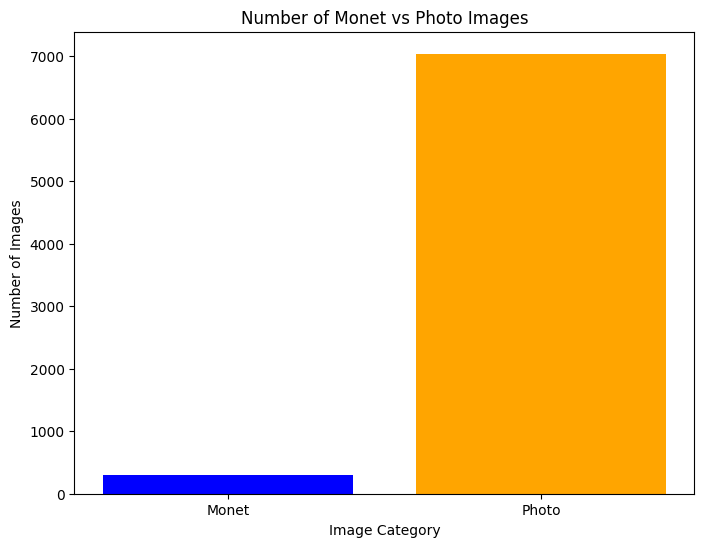

In [17]:
def plot_image_counts(num_monet, num_photo):
    plt.figure(figsize=(8, 6))
    counts = [num_monet, num_photo]
    labels = ['Monet', 'Photo']
    
    plt.bar(labels, counts, color=['blue', 'orange'])
    plt.xlabel('Image Category')
    plt.ylabel('Number of Images')
    plt.title('Number of Monet vs Photo Images')
    plt.show()

plot_image_counts(num_monet_images, num_photo_images)

There are vastly more photos (7038) compared to monet (300) works in the dataset. Which is unfortunate, because Monet has over 1,000 accessible digital paintings

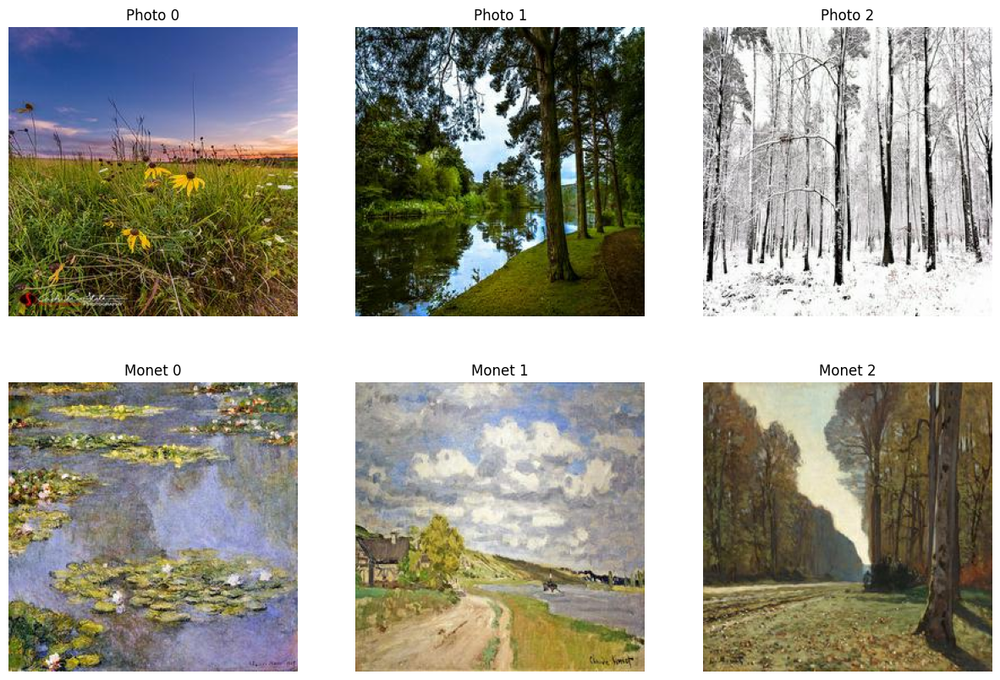

In [10]:
def display_sample_images(dataloader, num_samples=3):
    fig, axs = plt.subplots(2, num_samples, figsize=(15, 10))
    data_iter = iter(dataloader)
    sample_data = next(data_iter)
    
    for i in range(num_samples):
        photo_img, pic_img = sample_data[0][i], sample_data[1][i]
        
        photo_img = photo_img.permute(1, 2, 0) * 0.5 + 0.5  # denormalize
        pic_img = pic_img.permute(1, 2, 0) * 0.5 + 0.5      # denormalize
        
        axs[0, i].imshow(photo_img)
        axs[0, i].axis('off')
        axs[0, i].set_title(f'Photo {i}')
        
        axs[1, i].imshow(pic_img)
        axs[1, i].axis('off')
        axs[1, i].set_title(f'Monet {i}')
    
    plt.show()

batch_size = 128
art_dataset = ArtDataset('../input/gan-getting-started/monet_jpg/', '../input/gan-getting-started/photo_jpg/')
dataloader = DataLoader(art_dataset, batch_size=batch_size, pin_memory=True)  # faster data transfer to CUDA-enabled GPUs by pinned memory

# Display some sample images
display_sample_images(dataloader)

From the sample provided, Monet paintings noticably differ from Photos. Monet paintings feature visible brush strokes and softer edges. In contrast, the photos have more variety in content, such as the black and white photo while the photo to the left is a green landscape.

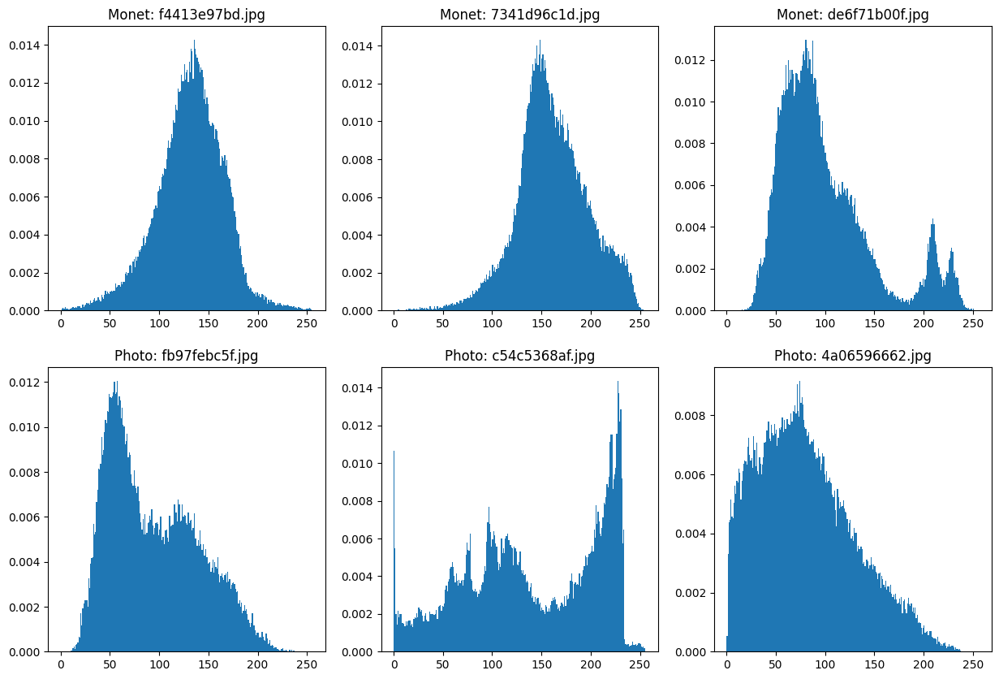

In [3]:
def get_image_paths(category_dir, num_samples):
    return [os.path.join(category_dir, img) for img in os.listdir(category_dir)[:num_samples]]

def image_to_grayscale_np(img_path):
    img = Image.open(img_path).convert('L')
    return np.array(img)

def plot_pixel_intensity(categories, num_samples=3):
    fig, axs = plt.subplots(len(categories), num_samples, figsize=(15, 10))
    for i, (category, category_dir) in enumerate(categories.items()):
        image_paths = get_image_paths(category_dir, num_samples)
        for j, img_path in enumerate(image_paths):
            img = image_to_grayscale_np(img_path)
            axs[i, j].hist(img.ravel(), bins=256, range=(0, 256), density=True)
            axs[i, j].set_title(f'{category}: {os.path.basename(img_path)}')
    plt.show()

categories = {
    "Monet": '../input/gan-getting-started/monet_jpg/',
    "Photo": '../input/gan-getting-started/photo_jpg/'
}

plot_pixel_intensity(categories)


From the sample images based on pixel intensity, which is the brightness value of a pixel. From the sample -  Monet paintings seem quite similiar while there are larger variations in the photos

In [ ]:
# Define the flattened dimension for 1D vectors
vector_dim = 256 * 256 * 3

def build_gen_block(input_dim, output_dim):

    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

class Generator(nn.Module):

    def __init__(self, image_dim=vector_dim, hidden_units=128):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            build_gen_block(image_dim, hidden_units),
            build_gen_block(hidden_units, hidden_units * 2),
            build_gen_block(hidden_units * 2, hidden_units * 4),
            build_gen_block(hidden_units * 4, hidden_units * 8),
            nn.Linear(hidden_units * 8, image_dim),
            nn.Sigmoid()
        )

    def forward(self, input_vector):
        return self.generator(input_vector
        )


I've designed a basic generator that would work for outputting photos into Monet style images.

I have four layers that progressively increases from 128 hidden units to 1024 hidden units. The progressive increase should help learn hierarchical features that help capture the Monet style. I've used batch normalization after each laye to help stabilize the training process. This could potentially help the model handle the range of colors and gradients in Monet's work. After normalization, I use ReLU, which allows the network to activate and deactivate certain neurons based on learned features. The final linear transformation and sigmoid activation scales the output pixel values between 0 and 1 for brightness and color.

In [7]:
def build_disc_block(input_dim, output_dim):

    return nn.Sequential(
         nn.Linear(input_dim, output_dim),
         nn.LeakyReLU(0.2, inplace=True)
    )

class Discriminator(nn.Module):
    
    def __init__(self, im_dim=vector_dim, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            build_disc_block(im_dim, hidden_dim * 4),
            build_disc_block(hidden_dim * 4, hidden_dim * 2),
            build_disc_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):

        return self.disc(image)

For the discriminator, I have three layers that progressively decrease from 512 hidden units to 128 hidden units. This progressive decrease helps the network focus on important features, capturing the subtle patterns and textures of Monet's style. Each layer uses Leaky ReLU activation with a negative slope of 0.2, which prevents the 'dying ReLU' problem by allowing a small gradient when inactive, thus aiding in learning more complex features. The choice of 0.2 for the negative slope ensures that the gradient is not too small, which helps in maintaining learning momentum even when neurons are not active. The final linear transformation reduces the dimensionality to 1, providing a single output for classification. Although a sigmoid activation is often applied during loss calculation, omitting it within the network allows for more flexibility in the choice of loss functions

In [8]:
loss_fn = nn.BCEWithLogitsLoss() 
epochs = 500
lr = 0.00001
device = 'cuda'

In [ ]:

generator = Generator(im_dim = vector_dim, hidden_dim = 128).to(device)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

def compute_generator_loss(generator, discriminator, loss_fn, real_images):
    fake_images = generator(real_images)
    discriminator_predictions = discriminator(fake_images)
    generator_loss = loss_fn(discriminator_predictions, torch.ones_like(discriminator_predictions))
    return generator_loss

In [9]:
discriminator = Discriminator().to(device) 
disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)

def compute_discriminator_loss(generator, discriminator, loss_fn, real_photos, real_paintings):
    fake_images = generator(real_photos)
    discriminator_fake_predictions = discriminator(fake_images.detach())
    loss_fake = loss_fn(discriminator_fake_predictions, torch.zeros_like(discriminator_fake_predictions))
    
    discriminator_real_predictions = discriminator(real_paintings)
    loss_real = loss_fn(discriminator_real_predictions, torch.ones_like(discriminator_real_predictions))
    
    total_loss = (loss_fake + loss_real) / 2
    return total_loss

In [11]:
def show_tensor_images(tensor_images, count=5, dimensions=(3, 256, 256)):
    unflattened_images = tensor_images.detach().cpu().view(-1, *dimensions)
    image_grid = make_grid(unflattened_images[:count], nrow=5)
    
    plt.figure(figsize=(20, 10))
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis('off')
    plt.show()

In [ ]:
import time
from tqdm import tqdm
import matplotlib.pyplot as plt

def train_gan_model(generator, discriminator, dataloader, compute_generator_loss, compute_discriminator_loss, gen_optimizer, disc_optimizer, loss_fn, epochs, device, batch_size):
    generator_losses = []
    discriminator_losses = []

    for epoch in range(epochs):
        total_gen_loss = 0
        total_disc_loss = 0
        batch_count = 0

        for pics, monet in tqdm(dataloader, desc=f"Epoch {epoch + 1}/{epochs}", leave=False):

            # Flatten the batch of real images from the dataset
            pics = pics.view(batch_size, -1).to(device)
            monet = monet.view(batch_size, -1).to(device)

            # Update discriminator 
            # Zero out the gradients before backpropagation
            disc_optimizer.zero_grad()

            disc_loss = compute_discriminator_loss(generator, discriminator, loss_fn, pics, monet)

            disc_loss.backward(retain_graph=True)

            disc_optimizer.step()
            
            gen_optimizer.zero_grad()
            generator_loss = compute_generator_loss(generator, discriminator, loss_fn, pics)
            generator_loss.backward()
            gen_optimizer.step()

            total_gen_loss += generator_loss.item()
            total_disc_loss += disc_loss.item()
            batch_count += 1

        # Calculate the mean losses for the epoch
        average_gen_loss = total_gen_loss / batch_count
        average_disc_loss = total_disc_loss / batch_count

        generator_losses.append(average_gen_loss)
        discriminator_losses.append(average_disc_loss)

    return generator_losses, discriminator_losses



gen_losses, disc_losses = train_gan_model(generator, discriminator, dataloader, compute_generator_loss, compute_discriminator_loss, gen_optimizer, disc_optimizer, loss_fn, epochs, device, batch_size)


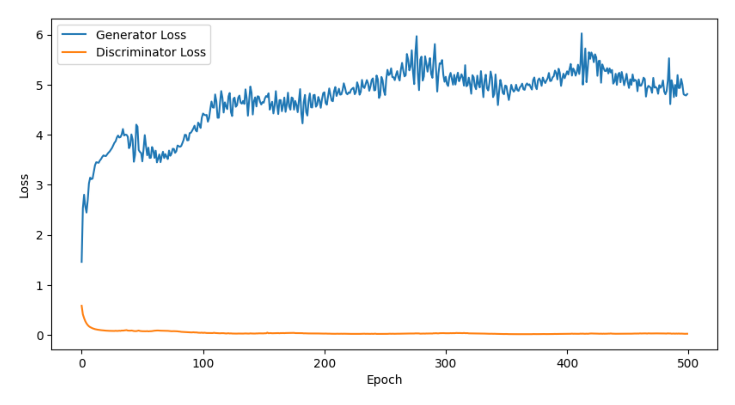

In [2]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label="Generator Loss")
plt.plot(disc_losses, label="Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Sample GAN results

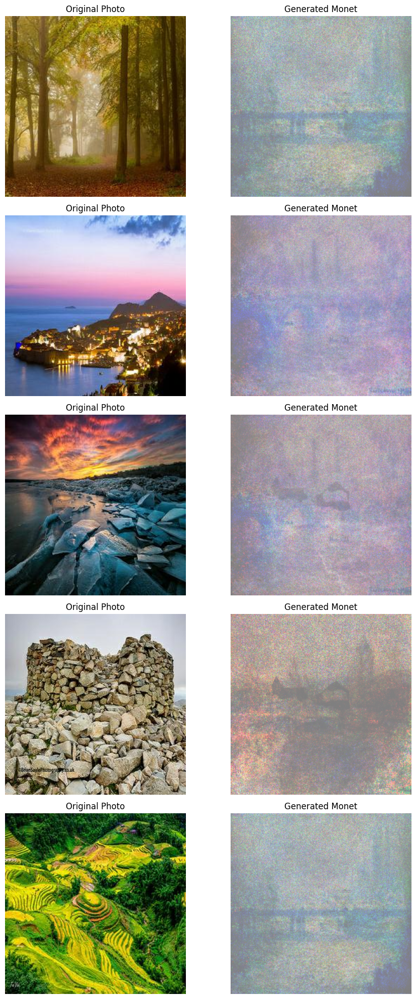

In [7]:
def transform_image():
    return transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])

def tensor_to_image(tensor, size=(3, 256, 256)):
    tensor = tensor.cpu().clone().detach().view(*size)
    tensor = tensor.numpy().transpose(1, 2, 0)
    tensor = (tensor * 0.5) + 0.5
    tensor = np.clip(tensor, 0, 1)
    return Image.fromarray((tensor * 255).astype(np.uint8))

def display_generated_images(generator, photo_dir, monet_dir, num_images=5):
    transform = transform_image()
    photo_paths = [os.path.join(photo_dir, img) for img in os.listdir(photo_dir)[:num_images]]
    monet_paths = [os.path.join(monet_dir, img) for img in os.listdir(monet_dir)[:num_images]]

    fig, axs = plt.subplots(num_images, 2, figsize=(10, 20))

    for i, (photo_path, monet_path) in enumerate(zip(photo_paths, monet_paths)):
        photo_img = Image.open(photo_path).convert('RGB')
        monet_img = Image.open(monet_path).convert('RGB')
        photo_tensor = transform(photo_img).unsqueeze(0).to(device)
        monet_tensor = transform(monet_img).unsqueeze(0).to(device)
        
        with torch.no_grad():
            gen_photo_tensor = generator(photo_tensor)
            gen_monet_tensor = generator(monet_tensor)
        
        gen_photo_img = tensor_to_image(gen_photo_tensor[0])
        gen_monet_img = tensor_to_image(gen_monet_tensor[0])
        
        axs[i, 0].imshow(photo_img)
        axs[i, 0].set_title("Original Photo")
        axs[i, 0].axis('off')
        
        axs[i, 1].imshow(gen_photo_img)
        axs[i, 1].set_title("Generated Monet")
        axs[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

display_generated_images(generator, photo_dir, monet_dir)


Unfortunately, the results were quite poor. The public score was 292.56873. What we can try now is tune the hyperparameters

### Hyperparam Tuning

In [12]:
class Generator(nn.Module):

    def __init__(self, im_dim=vector_dim, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            build_gen_block(im_dim, hidden_dim), 
            build_gen_block(hidden_dim, hidden_dim * 2), 
            build_gen_block(hidden_dim * 2, hidden_dim * 4), 
            build_gen_block(hidden_dim * 4, hidden_dim * 8),
            build_gen_block(hidden_dim * 8, hidden_dim * 16), 
            nn.Linear(hidden_dim * 16, im_dim), 
            nn.Sigmoid()
        )

    def forward(self, image):
        return self.gen(image)


Compared to the initial generator - I've added another layer, and increased the hidden dimensions, doubling it. This should help capture more details.

In [13]:
class Discriminator(nn.Module):
    
    def __init__(self, im_dim=vector_dim, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            build_disc_block(im_dim, hidden_dim * 8),
            build_disc_block(hidden_dim * 8, hidden_dim * 4),
            build_disc_block(hidden_dim * 4, hidden_dim * 2),
            build_disc_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)

I've also added another layer to the discriminator, doubling the number of hidden layers.

In [15]:
generator = Generator(im_dim=vector_dim, hidden_dim=128).to(device)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=lr)

discriminator = Discriminator(im_dim=vector_dim, hidden_dim=128).to(device)
disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr)

In [ ]:
gen_losses, disc_losses = train_gan_model(generator, discriminator, dataloader, compute_generator_loss, compute_discriminator_loss, gen_optimizer, disc_optimizer, loss_fn, epochs, device, batch_size)

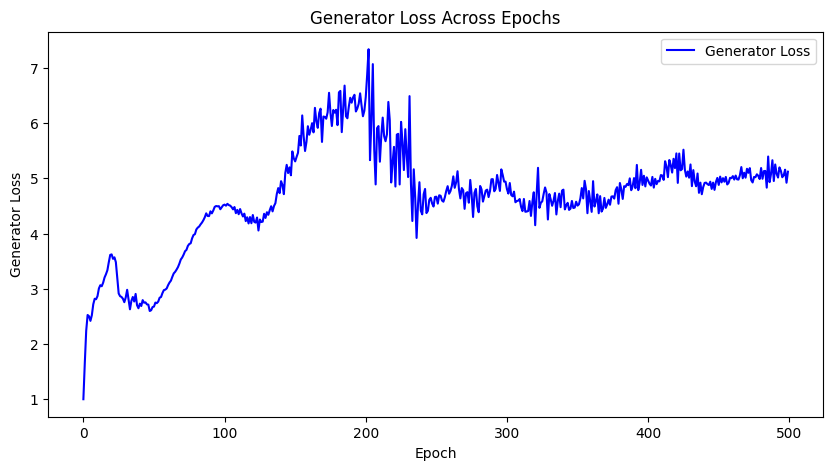

In [17]:
plt.figure(figsize=(10, 5))
plt.title("Generator Loss Across Epochs")
plt.plot(gen_losses, label="Generator Loss", color='blue')
plt.xlabel("Epoch")
plt.ylabel("Generator Loss")
plt.legend()
plt.show()

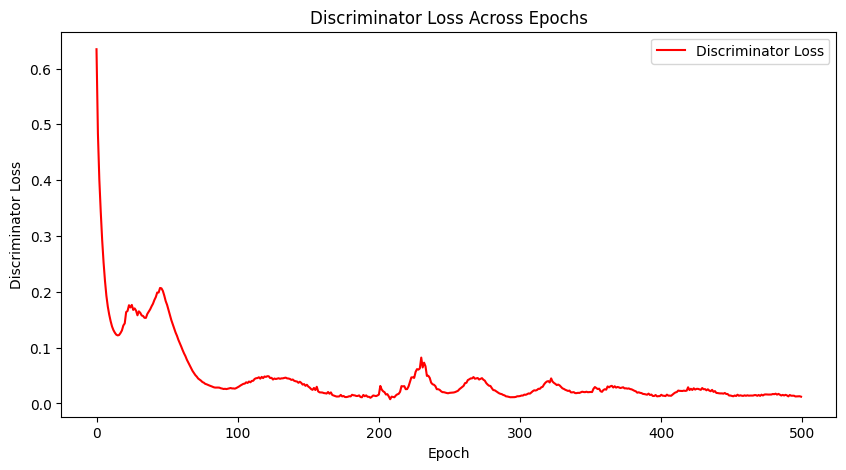

In [18]:
plt.figure(figsize=(10, 5))
plt.title("Discriminator Loss Across Epochs")
plt.plot(disc_losses, label="Discriminator Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Discriminator Loss")
plt.legend()
plt.show()

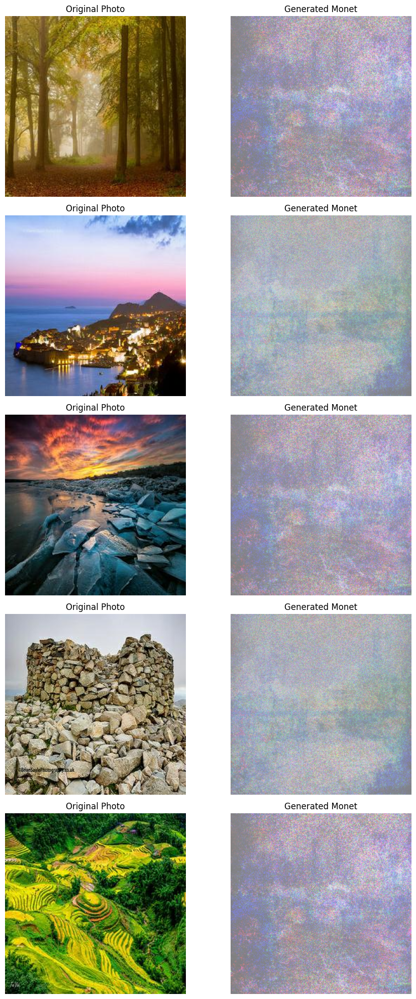

In [21]:
display_generated_images(generator, photo_dir, monet_dir)

Unfortunately, the results are still poor. The public score this time was 281.62205, which is only a 10 point improvement from 291.  To **troubleshoot** the poor performance - it's good to look up alternative architectures that are better suited for this type of problem. The steps are do a google search on what type of models are the best for the "Kaggle I'm something of a painter myself" dataset. And indeed, the issue is due to the architecture. The generator architecture has fully connected layers with progressively increasing hidden dimensions, which would perform suboptimally compared to CNN's as fully connected networks have issues capturing spatial hierarchices and local patterns.
https://builtin.com/machine-learning/fully-connected-layer
https://stats.stackexchange.com/questions/282030/what-can-possibly-go-wrong-in-a-generative-adversarial-network

Scores so far
| Model   | Public Score     |
|---------|-----------|
| Basic GAN | 281.62205 |
| Tuned Basic GAN | 292.56873 |

## Model 3
Now I'll try using a model with convolutional and transposed convolutional layers called a CycleGAN. The CycleGAN paper actually was the inspiration for this competition (the authors made pics into monet style images), so it seems like a good model to use.

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.down1 = self.downsample(3, 64, apply_instancenorm=False)
        self.down2 = self.downsample(64, 128)
        self.down3 = self.downsample(128, 256)
        self.down4 = self.downsample(256, 512)
        self.down5 = self.downsample(512, 512)
        self.down6 = self.downsample(512, 512)

        self.up1 = self.upsample(512, 512, apply_dropout=True)
        self.up2 = self.upsample(1024, 512, apply_dropout=True)
        self.up3 = self.upsample(1024, 512, apply_dropout=True)
        self.up4 = self.upsample(1024, 512)
        self.up5 = self.upsample(1024, 256)
        self.up6 = self.upsample(512, 128)
        self.up7 = self.upsample(256, 64)
        self.up8 = nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1)
        self.tanh = nn.Tanh()

    def downsample(self, in_channels, out_channels, apply_instancenorm=True):
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False)
        ]
        if apply_instancenorm:
            layers.append(nn.InstanceNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        return nn.Sequential(*layers)

    def upsample(self, in_channels, out_channels, apply_dropout=False):
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        if apply_dropout:
            layers.append(nn.Dropout(0.5))
        return nn.Sequential(*layers)

    def forward(self, x):
        down1 = self.down1(x)
        down2 = self.down2(down1)
        down3 = self.down3(down2)
        down4 = self.down4(down3)
        down5 = self.down5(down4)
        down6 = self.down6(down5)
        
        up1 = self.up1(down6)
        up2 = self.up2(torch.cat([up1, down5], 1))
        up3 = self.up3(torch.cat([up2, down4], 1))
        up4 = self.up4(torch.cat([up3, down3], 1))
        up5 = self.up5(torch.cat([up4, down2], 1))
        up6 = self.up6(torch.cat([up5, down1], 1))
        up7 = self.up7(up6)
        up8 = self.up8(up7)
        
        return self.tanh(up8)

The Generator uses a series of downsampling and upsampling blocks that help to capture and reconstruct spatial hierarchies and local patterns in images. This design preserves the spatial information throughout the network, enabling more coherent and detailed image generation. Instance normalization is used to stabilize training and improve convergence, while dropout layers in the upsampling blocks help prevent overfitting. The overall structure ensures that the network can effectively learn the mappings between the input and target domains, making it more capable of generating realistic and high-quality images compared to architectures using only fully connected layers.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            self.discriminator_block(3, 64, normalize=False),
            self.discriminator_block(64, 128),
            self.discriminator_block(128, 256),
            self.discriminator_block(256, 512),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)
        )

    def discriminator_block(self, in_filters, out_filters, normalize=True):
        layers = [nn.Conv2d(in_filters, out_filters, kernel_size=4, stride=2, padding=1)]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_filters))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        return nn.Sequential(*layers)

    def forward(self, img):
        return self.model(img)

def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('InstanceNorm') != -1:
        if hasattr(m, 'weight') and m.weight is not None:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
        if hasattr(m, 'bias') and m.bias is not None:
            nn.init.constant_(m.bias.data, 0)


The discriminator has been modified to use a CNN architecture as well. This architecture is deeper, with progressive increases in the number of filters from 64 to 512, allowing the model to learn more complex features. Instance normalization helps in stabilizing training and improving convergence. The final convolutional layer outputs a single channel feature map, which represents the discriminator's confidence in whether the input image is real or generated

In [ ]:
import torch.optim as optim
G_photo2monet = Generator().to(device)
G_monet2photo = Generator().to(device)
D_photo = Discriminator().to(device)
D_monet = Discriminator().to(device)

G_photo2monet.apply(init_weights)
G_monet2photo.apply(init_weights)
D_photo.apply(init_weights)
D_monet.apply(init_weights)

criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

optimizer_G_photo2monet = optim.Adam(G_photo2monet.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_G_monet2photo = optim.Adam(G_monet2photo.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_photo = optim.Adam(D_photo.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_monet = optim.Adam(D_monet.parameters(), lr=0.0002, betas=(0.5, 0.999))


This setup is characteristic of CycleGAN, which employs two generators and two discriminators to learn the mapping between two domains (photos and Monet-style images). The G_photo2monet generator converts photos to Monet-style images, and the G_monet2photo generator converts Monet-style images back to photos. The discriminators, D_photo and D_monet, distinguish between real and generated images in their respective domains. The use of the init_weights function ensures proper weight initialization. The loss functions, criterion_GAN (MSELoss) for adversarial loss, criterion_cycle (L1Loss) for cycle consistency loss, and criterion_identity (L1Loss) for identity loss, are essential to enforce that the mappings preserve important content while transferring style

In [ ]:
n_epochs = 100
lambda_cycle = 10.0
lambda_identity = 0.5

In [ ]:
train_gen_losses = []
train_disc_losses_photo = []
train_disc_losses_monet = []
val_gen_losses = []
val_disc_losses_photo = []
val_disc_losses_monet = []

for epoch in range(n_epochs):
    G_photo2monet.train()
    G_monet2photo.train()
    D_photo.train()
    D_monet.train()
    
    train_gen_loss = 0.0
    train_disc_loss_photo = 0.0
    train_disc_loss_monet = 0.0

    for i, (photo, monet) in enumerate(dataloader):
        photo = photo.to(device)
        monet = monet.to(device)

        # Adversarial ground truths
        valid = torch.ones(photo.size(0), 1, 30, 30).to(device)
        fake = torch.zeros(photo.size(0), 1, 30, 30).to(device)

        # train generator
        optimizer_G_photo2monet.zero_grad()
        optimizer_G_monet2photo.zero_grad()

        # Identity loss
        loss_identity_photo = criterion_identity(G_monet2photo(photo), photo)
        loss_identity_monet = criterion_identity(G_photo2monet(monet), monet)

        # GAN loss
        fake_monet = G_photo2monet(photo)
        loss_GAN_photo2monet = criterion_GAN(D_monet(fake_monet), valid)
        fake_photo = G_monet2photo(monet)
        loss_GAN_monet2photo = criterion_GAN(D_photo(fake_photo), valid)

        # Cycle loss
        recovered_photo = G_monet2photo(fake_monet)
        loss_cycle_photo = criterion_cycle(recovered_photo, photo)
        recovered_monet = G_photo2monet(fake_photo)
        loss_cycle_monet = criterion_cycle(recovered_monet, monet)

        # Total loss
        loss_G = (loss_GAN_photo2monet + loss_GAN_monet2photo) + \
                 lambda_cycle * (loss_cycle_photo + loss_cycle_monet) + \
                 lambda_identity * (loss_identity_photo + loss_identity_monet)

        loss_G.backward()
        optimizer_G_photo2monet.step()
        optimizer_G_monet2photo.step()

        train_gen_loss += loss_G.item()

        # Train discriminator
        optimizer_D_photo.zero_grad()
        optimizer_D_monet.zero_grad()

        # Real loss
        loss_D_real_photo = criterion_GAN(D_photo(photo), valid)
        loss_D_real_monet = criterion_GAN(D_monet(monet), valid)

        # Fake loss
        fake_photo = G_monet2photo(monet).detach()
        loss_D_fake_photo = criterion_GAN(D_photo(fake_photo), fake)
        fake_monet = G_photo2monet(photo).detach()
        loss_D_fake_monet = criterion_GAN(D_monet(fake_monet), fake)

        # Total loss
        loss_D_photo = (loss_D_real_photo + loss_D_fake_photo) * 0.5
        loss_D_monet = (loss_D_real_monet + loss_D_fake_monet) * 0.5

        loss_D_photo.backward()
        loss_D_monet.backward()

        optimizer_D_photo.step()
        optimizer_D_monet.step()

        train_disc_loss_photo += loss_D_photo.item()
        train_disc_loss_monet += loss_D_monet.item()

    train_gen_losses.append(train_gen_loss / len(dataloader))
    train_disc_losses_photo.append(train_disc_loss_photo / len(dataloader))
    train_disc_losses_monet.append(train_disc_loss_monet / len(dataloader))

    G_photo2monet.eval()
    G_monet2photo.eval()
    D_photo.eval()
    D_monet.eval()
    
    val_gen_loss = 0.0
    val_disc_loss_photo = 0.0
    val_disc_loss_monet = 0.0

    with torch.no_grad():
        for i, (photo, monet) in enumerate(dataloader):  # Replace with validation dataloader
            photo = photo.to(device)
            monet = monet.to(device)

            valid = torch.ones(photo.size(0), 1, 30, 30).to(device)
            fake = torch.zeros(photo.size(0), 1, 30, 30).to(device)

            # Validation for Generators
            loss_identity_photo = criterion_identity(G_monet2photo(photo), photo)
            loss_identity_monet = criterion_identity(G_photo2monet(monet), monet)

            fake_monet = G_photo2monet(photo)
            loss_GAN_photo2monet = criterion_GAN(D_monet(fake_monet), valid)
            fake_photo = G_monet2photo(monet)
            loss_GAN_monet2photo = criterion_GAN(D_photo(fake_photo), valid)

            recovered_photo = G_monet2photo(fake_monet)
            loss_cycle_photo = criterion_cycle(recovered_photo, photo)
            recovered_monet = G_photo2monet(fake_photo)
            loss_cycle_monet = criterion_cycle(recovered_monet, monet)

            loss_G = (loss_GAN_photo2monet + loss_GAN_monet2photo) + \
                     lambda_cycle * (loss_cycle_photo + loss_cycle_monet) + \
                     lambda_identity * (loss_identity_photo + loss_identity_monet)

            val_gen_loss += loss_G.item()

            # Validation for Discriminators
            loss_D_real_photo = criterion_GAN(D_photo(photo), valid)
            loss_D_real_monet = criterion_GAN(D_monet(monet), valid)

            fake_photo = G_monet2photo(monet).detach()
            loss_D_fake_photo = criterion_GAN(D_photo(fake_photo), fake)
            fake_monet = G_photo2monet(photo).detach()
            loss_D_fake_monet = criterion_GAN(D_monet(fake_monet), fake)

            loss_D_photo = (loss_D_real_photo + loss_D_fake_photo) * 0.5
            loss_D_monet = (loss_D_real_monet + loss_D_fake_monet) * 0.5

            val_disc_loss_photo += loss_D_photo.item()
            val_disc_loss_monet += loss_D_monet.item()

    val_gen_losses.append(val_gen_loss / len(dataloader))
    val_disc_losses_photo.append(val_disc_loss_photo / len(dataloader))
    val_disc_losses_monet.append(val_disc_loss_monet / len(dataloader))

    print(f"Epoch [{epoch}/{n_epochs}] | Train Loss G: {train_gen_losses[-1]:.4f} | "
          f"Train Loss D Photo: {train_disc_losses_photo[-1]:.4f} | Train Loss D Monet: {train_disc_losses_monet[-1]:.4f} | "
          f"Val Loss G: {val_gen_losses[-1]:.4f} | Val Loss D Photo: {val_disc_losses_photo[-1]:.4f} | Val Loss D Monet: {val_disc_losses_monet[-1]:.4f}")




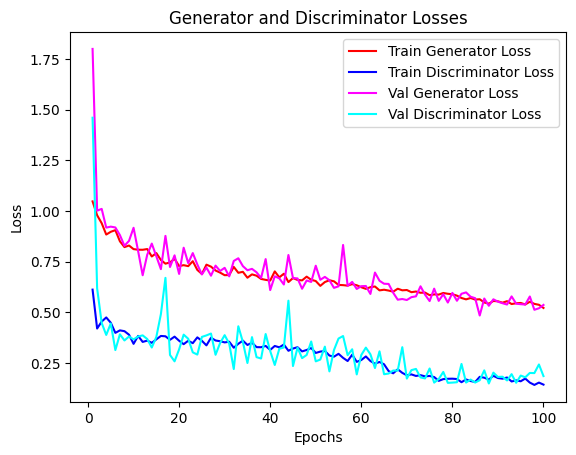

In [8]:
avereage_disc_loss = [x + y for x, y in zip(val_disc_losses_photo, val_disc_losses_monet)]

plt.plot(epochs, train_gen_losses, 'r', label='Train Generator Loss')
plt.plot(epochs, val_gen_losses, 'b', label='Train Discriminator Loss')
plt.plot(epochs, val_gen_losses, 'magenta', label='Val Generator Loss')
plt.plot(epochs, avereage_disc_loss, 'cyan', label='Val Discriminator Loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Losses')
plt.legend()
plt.show()


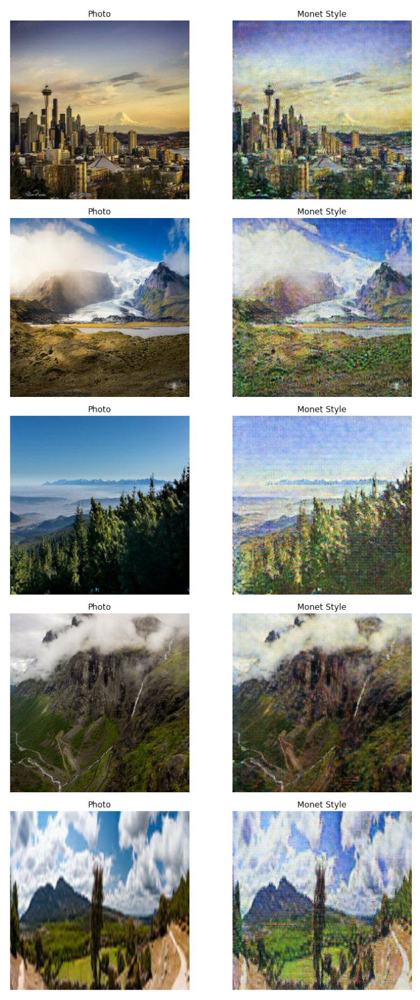

In [16]:
from PIL import Image
def tensor_to_image(tensor):
    image = tensor.cpu().numpy()
    image = (image * 0.5 + 0.5) * 255.0
    image = image.astype(np.uint8).transpose(1, 2, 0)
    return image

fig, axs = plt.subplots(5, 2, figsize=(10, 20))

G_photo2monet.eval()

for i, batch in enumerate(dataloader):
    if i >= 5:
        break
    real_photo = batch["photo"].to(device)
    with torch.no_grad():
        gen_monet_tensor = G_photo2monet(real_photo)
    
    photo_img = tensor_to_image(real_photo[0])
    gen_monet_img = tensor_to_image(gen_monet_tensor[0])
    
    axs[i, 0].imshow(photo_img)
    axs[i, 0].set_title("Original Photo")
    axs[i, 0].axis('off')
    
    axs[i, 1].imshow(gen_monet_img)
    axs[i, 1].set_title("Generated Monet")
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


These results are much better than the basic GAN. There is stil some noise - like something out of a poor VCR tape recording with the distortions. This model yieled a public score of 75.15467 which is a fantastic improvement from 281!

## Conclusion

### Basic Reiteration of Results
The CycleGAN model significantly improved the generation of Monet-style images from photos, achieving a public score of 75.15467, a substantial improvement from the initial scores of 281.62205 and 292.56873 with the basic and tuned GAN models.

| Model                  | Score     |
|------------------------|-----------|
| Basic GAN Model        | 281.62205 |
| Tuned GAN Model        | 292.56873 |
| CycleGAN Model         | 75.15467  |
### Learning and Takeaways
The transition from fully connected layers in a simple GAN to convolutional layers in the CycleGAN demonstrated the importance of appropriate architectural choices in handling image data. Convolutional layers effectively capture spatial hierarchies and local patterns, essential for style transfer tasks like transforming photos into Monet-style images.

### Why Something Didn’t Work
The initial GAN models failed primarily due to their inability to handle the spatial complexity and textural details characteristic of Monet’s paintings. Fully connected layers lack the spatial sensitivity required for such tasks, leading to poor performance in capturing and reproducing the artistic style effectively.

### How to improve
The highest scoring model on Kaggle uses something called CLIPTraVeLGAN, with a public score of 35! Wow.
https://www.kaggle.com/code/unfriendlyai/cliptravelgan-monet-article-implementation

In [ ]:
import shutil

output_dir = "../images"
os.makedirs(output_dir, exist_ok=True)

G_photo2monet.eval()
G_monet2photo.eval()

i = 1
for batch in tqdm(dataloader, desc="Generating images"):
    real_photo = batch["photo"].to(device)
    with torch.no_grad():
        prediction = G_photo2monet(real_photo)[0].cpu().numpy()
    
    # Denormalize the image
    prediction = (prediction * 0.5 + 0.5) * 255.0
    prediction = prediction.astype(np.uint8).transpose(1, 2, 0)
    
    im = PIL.Image.fromarray(prediction)
    im.save(os.path.join(output_dir, f"{i}.jpg"))
    i += 1

shutil.make_archive("/kaggle/working/images", 'zip', output_dir)

model_dir = "/kaggle/working/models"
os.makedirs(model_dir, exist_ok=True)
torch.save(G_photo2monet.state_dict(), os.path.join(model_dir, "G_photo2monet.pth"))
torch.save(G_monet2photo.state_dict(), os.path.join(model_dir, "G_monet2photo.pth"))
torch.save(D_photo.state_dict(), os.path.join(model_dir, "D_photo.pth"))
torch.save(D_monet.state_dict(), os.path.join(model_dir, "D_monet.pth"))


## References
https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial

https://arxiv.org/abs/1703.10593

https://www.run.ai/guides/deep-learning-for-computer-vision/pytorch-gan